# **Imports**

In [ ]:
%%capture
!pip install -q lime shap

In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
import kagglehub
from scipy.stats import zscore, chisquare, chi2_contingency
from sklearn.model_selection import train_test_split, learning_curve, ValidationCurveDisplay
from sklearn.feature_selection import mutual_info_classif, chi2, f_classif
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay, RocCurveDisplay, auc
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN
from matplotlib import cm
import matplotlib.ticker as mtick
import matplotlib.gridspec as gridspec
from sklearn.tree import plot_tree
from sklearn.inspection import PartialDependenceDisplay
import warnings
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.ensemble import StackingClassifier
from imblearn.ensemble import BalancedBaggingClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
import plotly.graph_objects as go
warnings.filterwarnings('ignore')

# **Data Loading & Preprocessing**

In [ ]:
path = kagglehub.dataset_download('pavansubhasht/ibm-hr-analytics-attrition-dataset')
df = pd.read_csv(f"{path}/WA_Fn-UseC_-HR-Employee-Attrition.csv")
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [ ]:
# drop irrelevant columns
df.drop(['EmployeeCount', 'EmployeeNumber', 'Over18', 'StandardHours'], axis="columns", inplace=True)

In [ ]:
num_df = df.select_dtypes(include=['number'])
cat_df = df.select_dtypes(include=['object'])

## **Data Cleaning**

### Check Missing Values

In [ ]:
df.isna().sum().sum()

np.int64(0)

In [ ]:
df.isnull().sum()

,0
Age,0
Attrition,0
BusinessTravel,0
DailyRate,0
Department,0
DistanceFromHome,0
Education,0
EducationField,0
EnvironmentSatisfaction,0
Gender,0


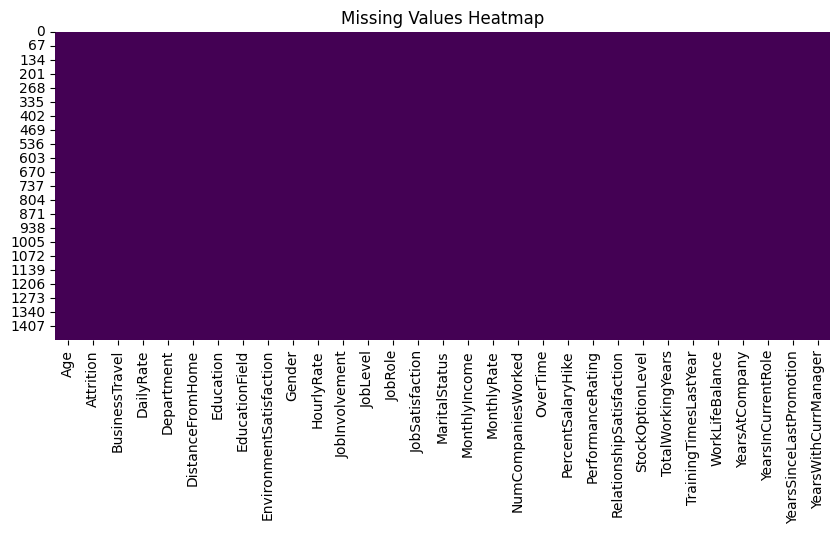

In [ ]:
plt.figure(figsize=(10, 4))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

### Check for Duplicates

In [ ]:
df.duplicated().sum()

np.int64(0)

### Outlier Detection

[Text(4, 0, '13'),
 Text(4, 0, '14'),
 Text(4, 0, '16'),
 Text(4, 0, '25'),
 Text(4, 0, '42')]

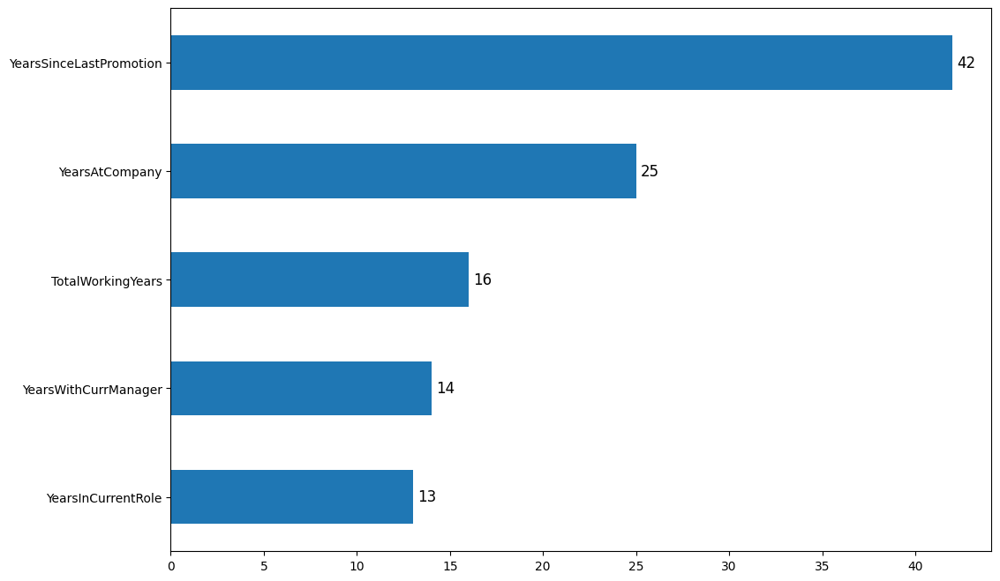

In [ ]:
original_rows = df.shape[0]
df_z = num_df.apply(zscore)
outliers = (df_z.abs() > 3).sum().sort_values()
ax = outliers[-5:].plot(kind='barh', figsize=(12, 8))
ax.bar_label(ax.containers[0], padding=4, fontsize=12)

In [ ]:
outlier_mask = (df_z.abs() > 3).any(axis=1)
df.drop(df.index[outlier_mask], inplace=True)
num_df = num_df.loc[df.index]
print(f"Number of rows deleted: {original_rows - df.shape[0]}")

Number of rows deleted: 83


# **Exploratory Data Analysis (EDA)**

## Statistical Summary

In [ ]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,...,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000
mean,36.258111,806.054074,9.176640,2.896179,2.725306,65.847152,2.733237,1.956020,2.741168,6025.912040,...,3.152848,2.703677,0.795963,10.302091,2.803893,2.762797,6.104542,3.867340,1.775775,3.800288
std,8.838767,403.163183,8.088602,1.023198,1.090541,20.280564,0.709296,1.015862,1.100990,4248.299591,...,0.359971,1.081529,0.856710,6.699832,1.291737,0.705043,4.679161,3.244441,2.499533,3.258874
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,467.500000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2847.500000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,35.000000,807.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4739.000000,...,3.000000,3.000000,1.000000,9.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,42.000000,1160.000000,14.000000,4.000000,4.000000,83.000000,3.000000,2.000000,4.000000,7325.000000,...,3.000000,4.000000,1.000000,13.000000,3.000000,3.000000,9.000000,7.000000,2.000000,7.000000
max,60.000000,1498.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19943.000000,...,4.000000,4.000000,3.000000,34.000000,6.000000,4.000000,25.000000,15.000000,11.000000,14.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1387 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1387 non-null   int64 
 1   Attrition                 1387 non-null   object
 2   BusinessTravel            1387 non-null   object
 3   DailyRate                 1387 non-null   int64 
 4   Department                1387 non-null   object
 5   DistanceFromHome          1387 non-null   int64 
 6   Education                 1387 non-null   int64 
 7   EducationField            1387 non-null   object
 8   EnvironmentSatisfaction   1387 non-null   int64 
 9   Gender                    1387 non-null   object
 10  HourlyRate                1387 non-null   int64 
 11  JobInvolvement            1387 non-null   int64 
 12  JobLevel                  1387 non-null   int64 
 13  JobRole                   1387 non-null   object
 14  JobSatisfaction           138

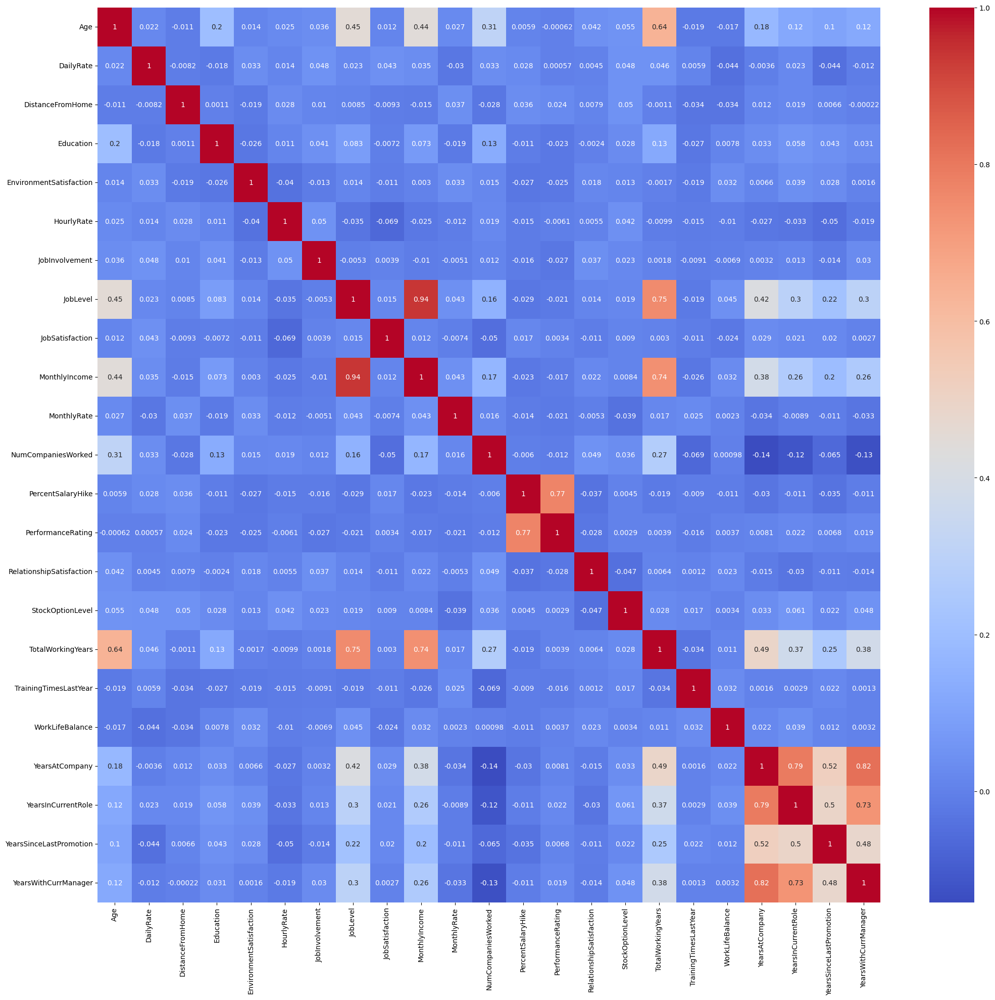

In [ ]:
corr = num_df.corr()
plt.figure(figsize=(25, 23))
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.show()

In [ ]:
for col in cat_df:
    print(df[col].value_counts())
    print('-'*50)

Attrition
No     1158
Yes     229
Name: count, dtype: int64
--------------------------------------------------
BusinessTravel
Travel_Rarely        981
Travel_Frequently    263
Non-Travel           143
Name: count, dtype: int64
--------------------------------------------------
Department
Research & Development    909
Sales                     420
Human Resources            58
Name: count, dtype: int64
--------------------------------------------------
EducationField
Life Sciences       570
Medical             437
Marketing           149
Technical Degree    127
Other                79
Human Resources      25
Name: count, dtype: int64
--------------------------------------------------
Gender
Male      835
Female    552
Name: count, dtype: int64
--------------------------------------------------
JobRole
Sales Executive              313
Research Scientist           291
Laboratory Technician        254
Manufacturing Director       139
Healthcare Representative    122
Sales Representative   

In [ ]:
fig, axes = plt.subplots(-(-len(cat_cols)//4), 4, figsize=(20,8))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    sns.countplot(x=col, data=df, ax=axes[i], order=df[col].value_counts().index)
    axes[i].set_title(col)
    axes[i].tick_params(axis='x', rotation=45)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()

## Visualization

### Univariate Analysis

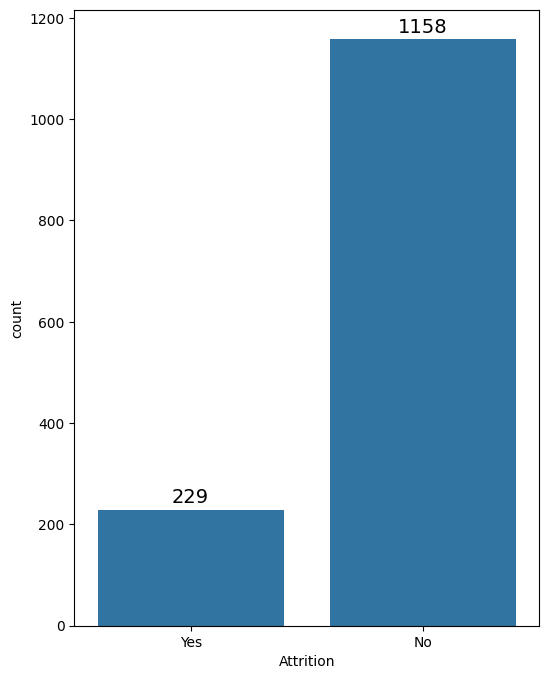

In [ ]:
plt.figure(figsize=(6, 8))
ax = sns.countplot(x='Attrition', data=df)
ax.bar_label(ax.containers[0], fontsize=14, padding=2)
plt.show()

As shown in the figure, there is imbalance in the class distribution. This issue will be fixed using SMOTE as an over sampling technique.



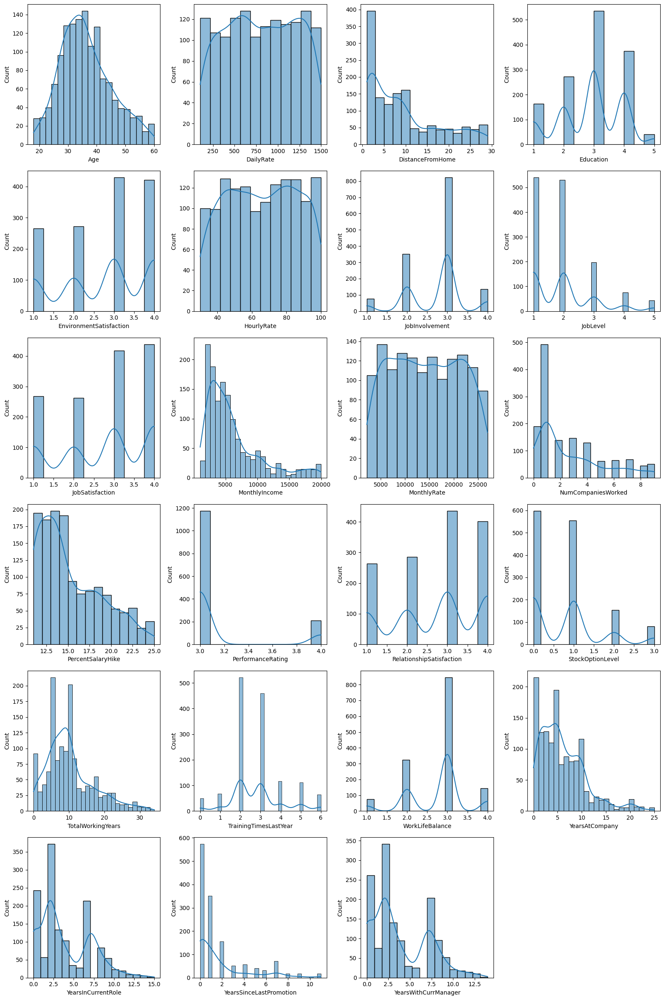

In [ ]:
num_plots = len(num_df.columns)
num_rows = (num_plots + 3) // 4
plt.figure(figsize=(16, 4 * num_rows))

for i, col in enumerate(num_df.columns):
     plt.subplot(num_rows, 4, i + 1)
     sns.histplot(df[col],kde=True)

plt.tight_layout()

In [ ]:
threshold = df['YearsAtCompany'].quantile(0.99)
df['YearsAtCompany'] = np.where(df['YearsAtCompany'] > threshold, threshold, df['YearsAtCompany'])

<Axes: xlabel='YearsAtCompany', ylabel='Count'>

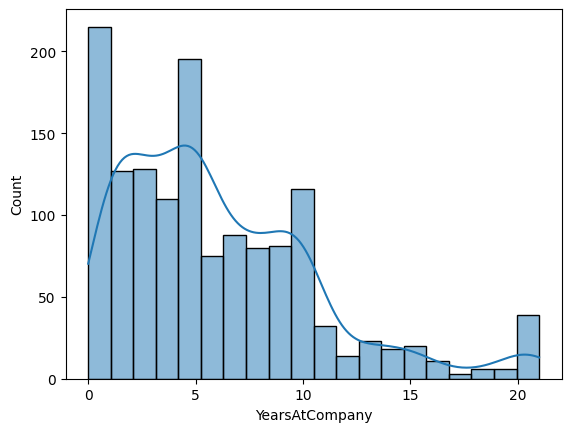

In [ ]:
sns.histplot(df['YearsAtCompany'],kde = True)

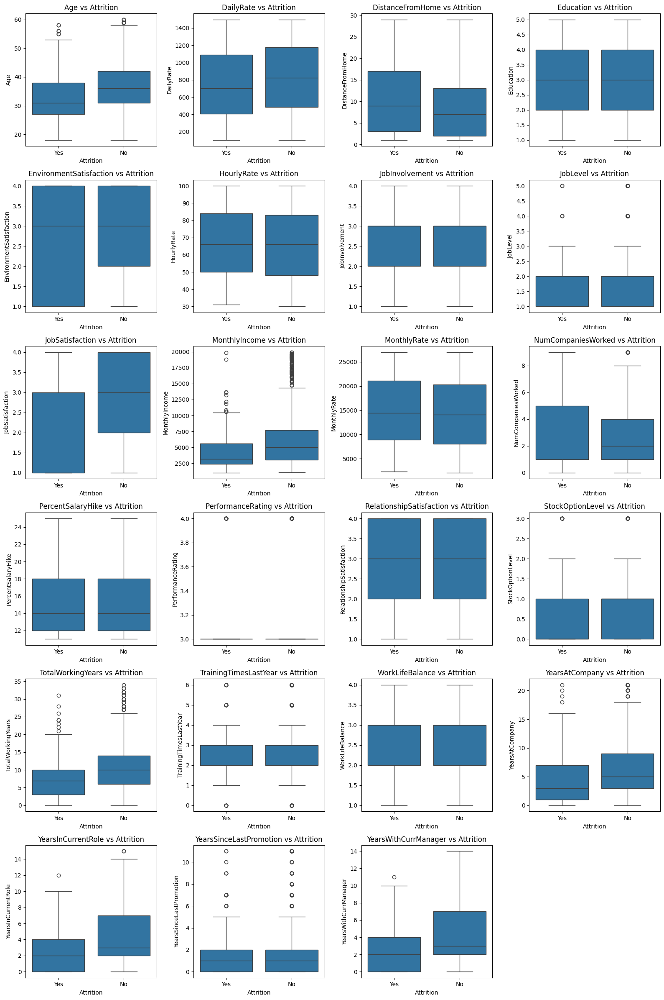

In [ ]:
plt.figure(figsize=(16, 4 * num_rows))

for i,col in enumerate(num_df.columns):
    plt.subplot(num_rows, 4, i + 1)
    sns.boxplot(x = 'Attrition', y = col, data = df)
    plt.title(f'{col} vs Attrition')

plt.tight_layout()
plt.show()

### Bivariate/Multivariate Analysis

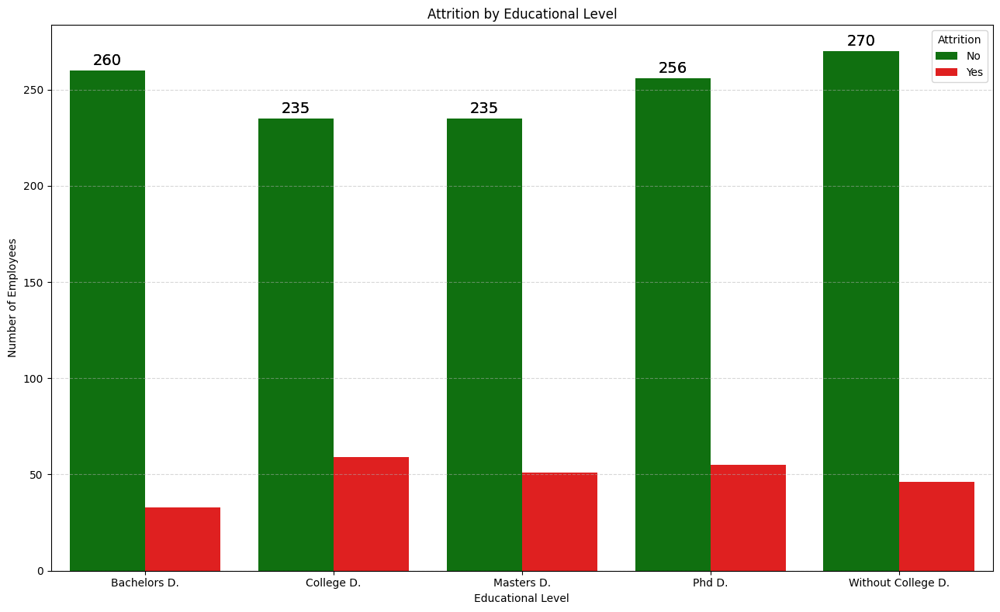

In [ ]:
np.random.seed(42)
n_samples = 1500
education_levels = np.random.randint(1, 6, n_samples)
attrition_prob = 0.1 + (education_levels < 3) * 0.05 + (education_levels > 3) * 0.08
df1 = pd.DataFrame({
    'Education': education_levels,
    'Attrition': ['Yes' if a else 'No' for a in (np.random.rand(n_samples) < attrition_prob)]
})
edu_mapping = {1: "Without College D.", 2: "College D.", 3: "Bachelors D.", 4: "Masters D.", 5: "Phd D."}
df1['Educational_Levels'] = df1['Education'].map(edu_mapping)
edu_counts = df1.groupby(['Educational_Levels', 'Attrition']).size().reset_index(name='n')
plt.figure(figsize=(13, 8))
ax = sns.barplot(data=edu_counts, x='Educational_Levels', y='n', hue='Attrition',palette={"Yes": "red", "No": "green"} )
plt.title("Attrition by Educational Level")
plt.xlabel("Educational Level")
plt.ylabel("Number of Employees")
plt.grid(axis='y', linestyle='--', alpha=0.5)
for container in ax.containers:
    ax.bar_label(ax.containers[0], padding=2, fontsize=14)
plt.tight_layout()

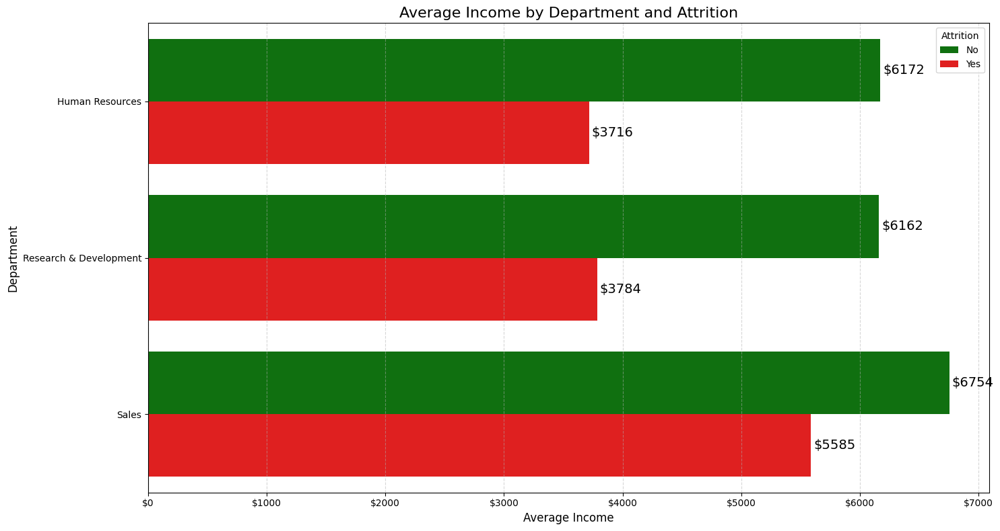

In [ ]:
avg_income = df.groupby(['Department', 'Attrition'])['MonthlyIncome'].mean().reset_index()
plt.figure(figsize=(15, 8))
ax = sns.barplot(data=avg_income, y='Department', x='MonthlyIncome', hue='Attrition',palette={"Yes": "red", "No": "green"} )
plt.title("Average Income by Department and Attrition", fontsize=16)
plt.xlabel("Average Income", fontsize=12)
plt.ylabel("Department", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.gca().xaxis.set_major_formatter(mtick.FormatStrFormatter('$%.0f'))

for container in ax.containers:
    ax.bar_label(container, fmt='$%.0f', padding=3, fontsize=14)
plt.tight_layout()
plt.show()

[Text(0, 0, 'Low'),
 Text(1, 0, 'Medium'),
 Text(2, 0, 'High'),
 Text(3, 0, 'Very High')]

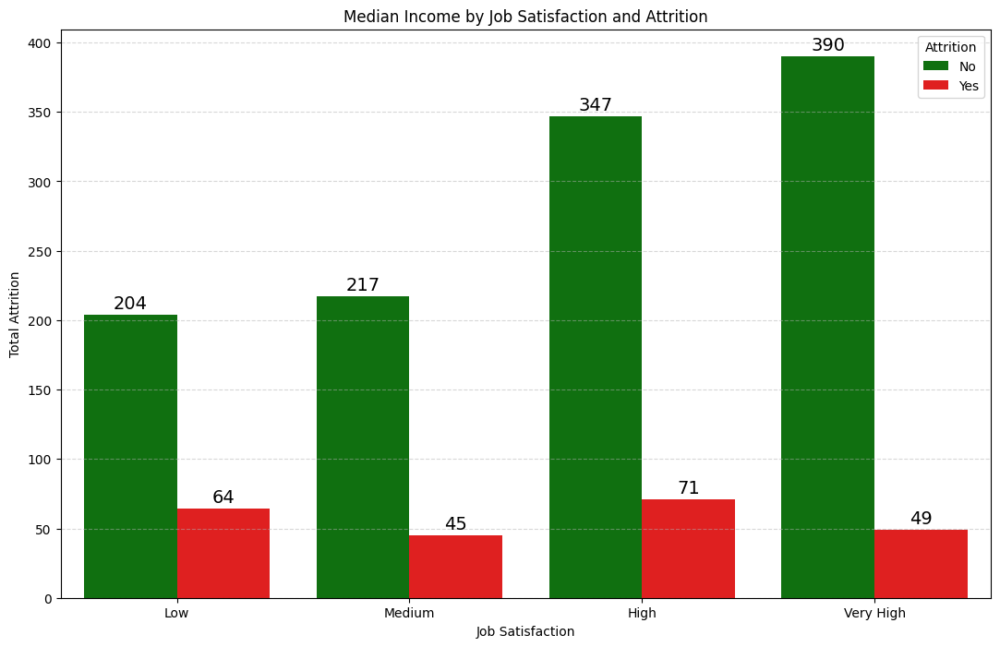

In [ ]:
median_income_df = df.groupby(['JobSatisfaction', 'Attrition'])['MonthlyIncome'].count().reset_index()
plt.figure(figsize=(13, 8))
ax = sns.barplot(data=median_income_df, x='JobSatisfaction', y='MonthlyIncome', hue='Attrition',palette={"Yes": "red", "No": "green"} )
plt.title("Median Income by Job Satisfaction and Attrition")
plt.xlabel("Job Satisfaction")
plt.ylabel("Total Attrition")
plt.grid(axis='y', linestyle='--', alpha=0.5)
for container in ax.containers:
    ax.bar_label(container, padding=2, fontsize=14)

ax.set_xticklabels(['Low', 'Medium', 'High', "Very High"])


In [ ]:
attrition_pct = df.groupby('OverTime')['Attrition'].value_counts(normalize=True).unstack() * 100

labels = ['No Overtime', 'Overtime']
values = [attrition_pct.loc['No', 'Yes'], attrition_pct.loc['Yes', 'Yes']]

fig = go.Figure(data=[go.Pie(
    labels=labels,
    values=values,
    hole=0.5,
    marker_colors=['#58FA58', '#FA5858'],
    textinfo='percent',
    textfont_size=14
)])

fig.update_layout(
    title_text='Level of Attrition by Overtime Status</sup>',
    title_font_size=16,
    height=500,
    width=700,
    showlegend=True
)

fig.show()

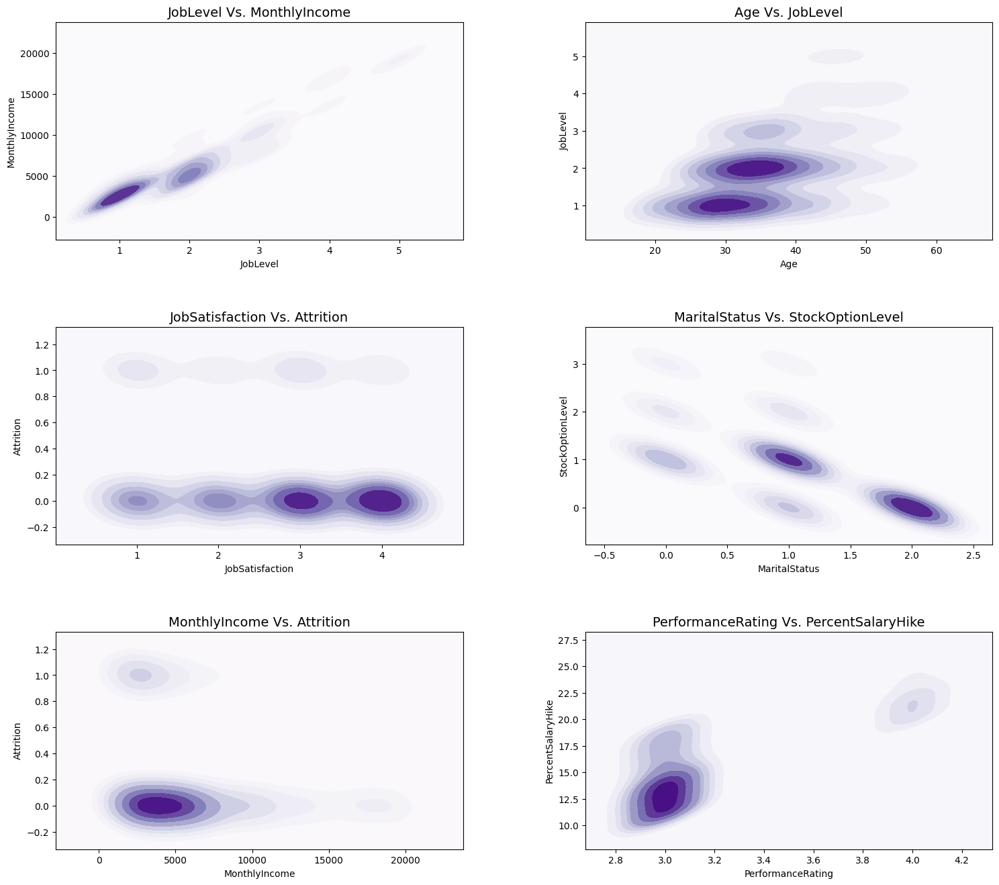

In [ ]:
df.Attrition = df.Attrition.astype('category').cat.codes
df.MaritalStatus = df.MaritalStatus.astype('category').cat.codes
plot_pairs = [
    ('JobLevel', 'MonthlyIncome'),
    ('Age', 'JobLevel'),
    ('JobSatisfaction', 'Attrition'),
    ('MaritalStatus', 'StockOptionLevel'),
    ('MonthlyIncome', 'Attrition'),
    ('PerformanceRating', 'PercentSalaryHike')
]
fig, axes = plt.subplots(3, 2, figsize=(18, 16))
plt.subplots_adjust(hspace=0.4, wspace=0.3)

for ax, (col1, col2) in zip(axes.flat, plot_pairs):
    sns.kdeplot(data=df, x=col1, y=col2, cmap='Purples', shade=True, thresh=0, levels=10, ax=ax)
    ax.set_title(f'{col1} Vs. {col2}', fontsize=14)
    ax.set_xlabel(col1)
    ax.set_ylabel(col2)
    ax.set_facecolor('#faf5f1')

plt.show()

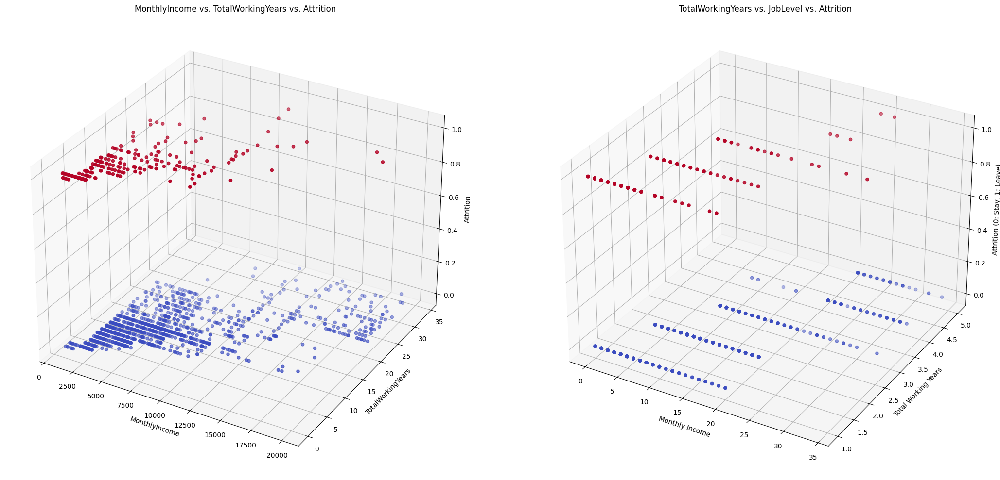

In [ ]:
df.Attrition = df.Attrition.astype('category').cat.codes

fig = plt.figure(figsize=(22, 10))

ax1 = fig.add_subplot(121, projection='3d')
scatter1 = ax1.scatter(df['MonthlyIncome'], df['TotalWorkingYears'], df['Attrition'],
                       c=df['Attrition'], cmap='coolwarm', marker='o')
ax1.set_xlabel('MonthlyIncome')
ax1.set_ylabel('TotalWorkingYears')
ax1.set_zlabel('Attrition')
ax1.set_title('MonthlyIncome vs. TotalWorkingYears vs. Attrition')

ax2 = fig.add_subplot(122, projection='3d')
scatter2 = ax2.scatter(df['TotalWorkingYears'], df['JobLevel'], df['Attrition'],
                       c=df['Attrition'], cmap='coolwarm', marker='o')
ax2.set_xlabel('Monthly Income')
ax2.set_ylabel('Total Working Years')
ax2.set_zlabel('Attrition (0: Stay, 1: Leave)')
ax2.set_title('TotalWorkingYears vs. JobLevel vs. Attrition')

plt.tight_layout()

# **Feature Engineering & Pre-modeling**

## Feature Creation (if required)

In [ ]:
df['promotion_velocity'] = df['YearsAtCompany'] / (df['YearsSinceLastPromotion'] + 1e-5)
df['workload_score'] = df['OverTime'] * (5 - df['WorkLifeBalance'])
df['compensation_ratio'] = df['MonthlyIncome'] / df.groupby('JobRole')['MonthlyIncome'].transform('median')

## **Data Splitting**

In [ ]:
# one-hot encoding


In [ ]:
# # feature scaling
# numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
# scaler = StandardScaler()
# df[numerical_features] = scaler.fit_transform(df[numerical_features])

In [ ]:
X = df.drop(['Attrition'], axis=1)
y = df['Attrition']

le = LabelEncoder()
for col in X.select_dtypes(include=['object']).columns:
    X[col] = le.fit_transform(X[col])
y = le.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)

In [ ]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.8078602620087336


## Feature Selection

### Information Gain

Text(0.5, 1.0, 'Feature Importance based on Information Gain')

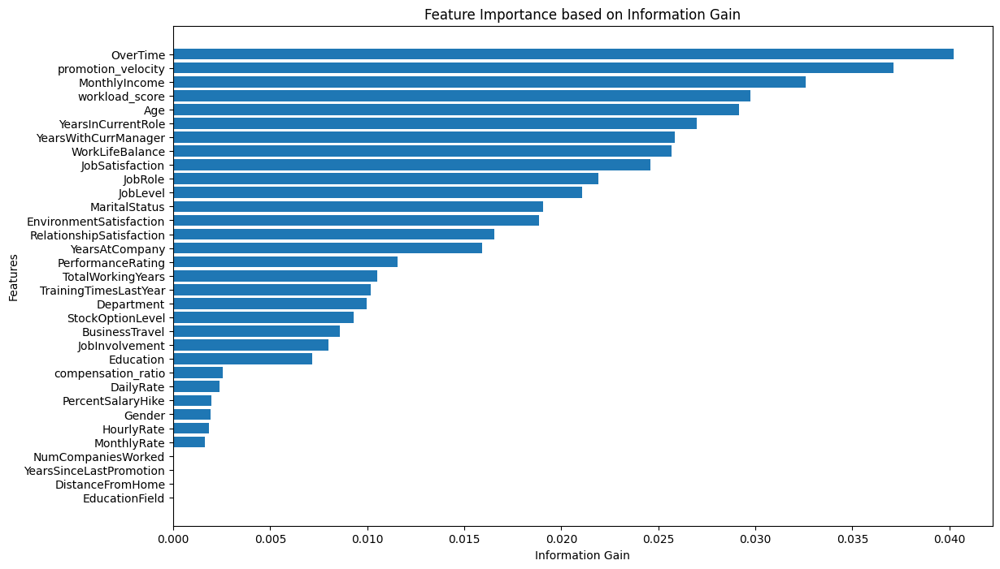

In [ ]:
info_gain = mutual_info_classif(X, y)

indices = np.argsort(info_gain)
features_sorted = X.columns[indices]
info_gain_sorted = info_gain[indices]

plt.figure(figsize=(13, 8))
plt.barh(features_sorted, info_gain_sorted)
plt.xlabel("Information Gain")
plt.ylabel("Features")
plt.title("Feature Importance based on Information Gain")

### Chi-Square Test

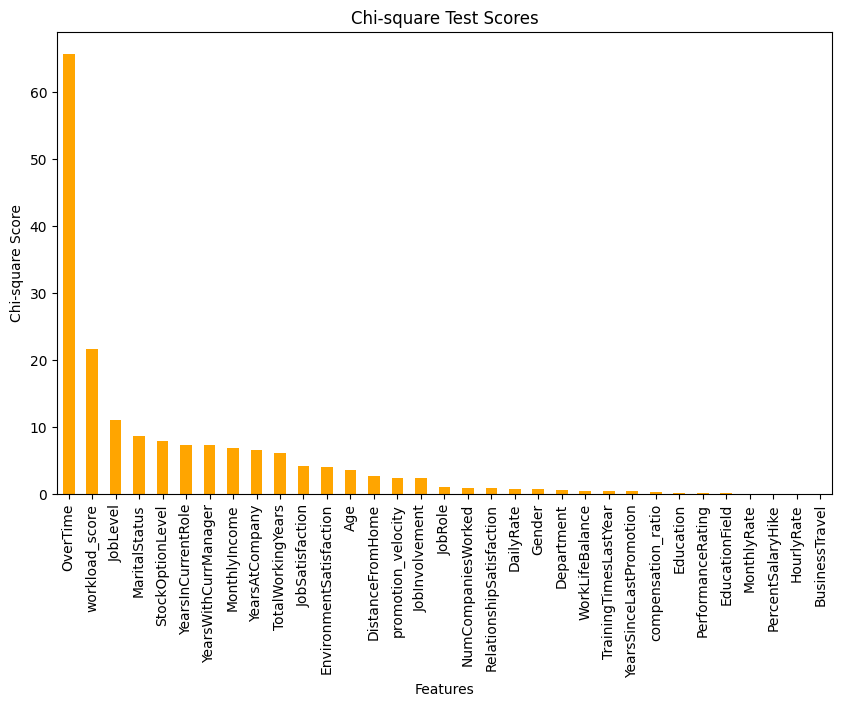

In [ ]:
minmax_scaler = MinMaxScaler()
X_non_negative = minmax_scaler.fit_transform(X)

y_bin = np.where(y > np.median(y), 1, 0)

chi2_scores, _ = chi2(X_non_negative, y_bin)
feature_names = X.columns
chi2_scores = pd.Series(chi2_scores, index=feature_names)
chi2_scores.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
chi2_scores.plot(kind="bar", color="orange")
plt.title("Chi-square Test Scores")
plt.xlabel("Features")
plt.ylabel("Chi-square Score")
plt.show()

### Fisher Score

Text(0, 0.5, 'Fisher’s Score')

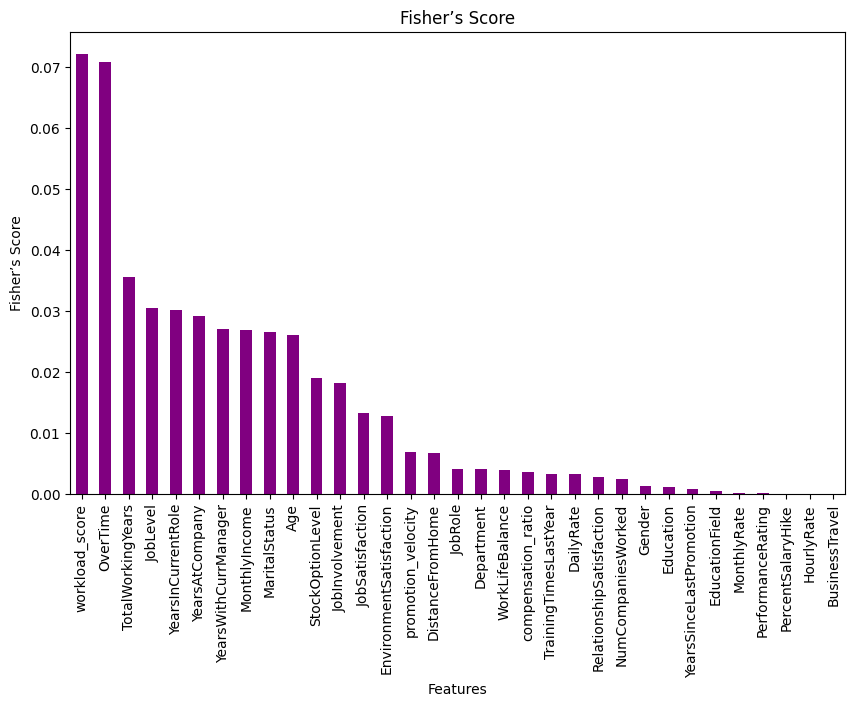

In [ ]:
def fisher_score(X, y):
    classes = np.unique(y)
    overall_mean = np.mean(X, axis=0)
    between_var = np.zeros(X.shape[1])
    within_var = np.zeros(X.shape[1])

    for c in classes:
        X_c = X[y == c]
        mean_c = np.mean(X_c, axis=0)
        n_c = X_c.shape[0]

        between_var += n_c * (mean_c - overall_mean) ** 2
        within_var += np.sum((X_c - mean_c) ** 2, axis=0)

    fisher_scores = between_var / within_var
    return fisher_scores

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
fisher_scores = fisher_score(X_scaled, y_bin)
fisher_scores = pd.Series(fisher_scores, index=feature_names)
fisher_scores.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
fisher_scores.plot(kind="bar", color="purple")
plt.title("Fisher’s Score")
plt.xlabel("Features")
plt.ylabel("Fisher’s Score")


### Correlation Coefficient

Text(0, 0.5, 'Correlation Coefficient')

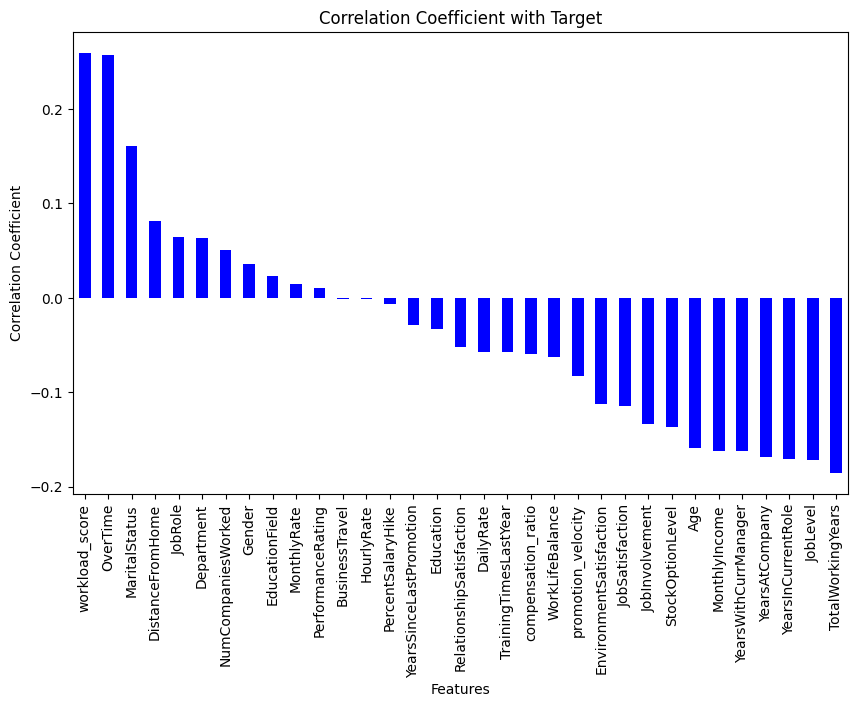

In [ ]:
corr_scores = np.corrcoef(X.T, y)[-1, :-1]
corr_scores = pd.Series(corr_scores, index=feature_names)
corr_scores.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
corr_scores.plot(kind="bar", color="blue")
plt.title("Correlation Coefficient with Target")
plt.xlabel("Features")
plt.ylabel("Correlation Coefficient")


### ANOVA

Text(0, 0.5, 'F-score')

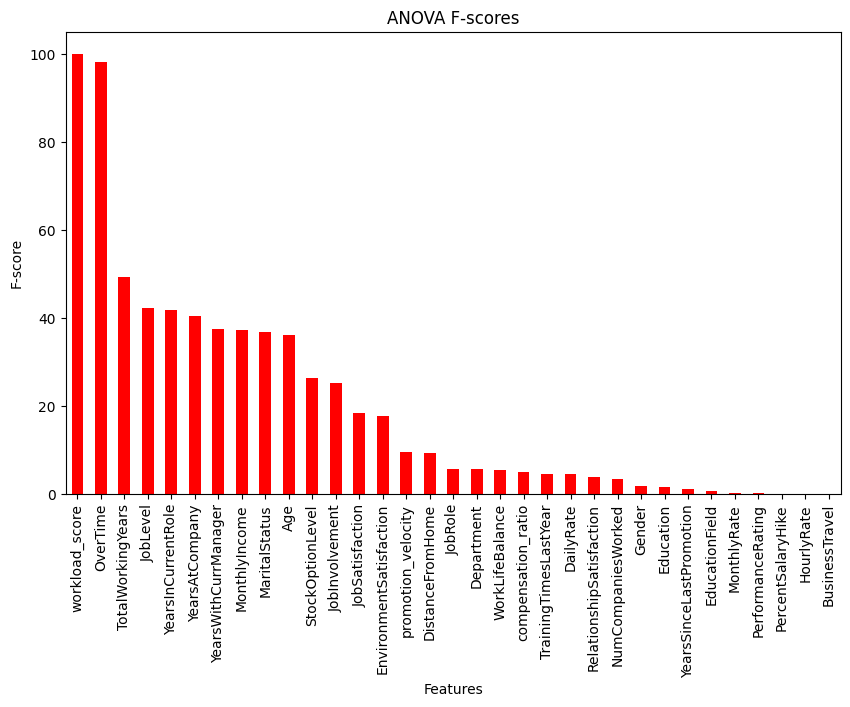

In [ ]:
f_scores, _ = f_classif(X, y)
f_scores = pd.Series(f_scores, index=feature_names)
f_scores.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
f_scores.plot(kind="bar", color="red")
plt.title("ANOVA F-scores")
plt.xlabel("Features")
plt.ylabel("F-score")


## **Balancing the Data**

In [ ]:
clf = RandomForestClassifier(random_state=0)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print("Classification Report (Before Applying Balancing Techniques):")
print(classification_report(y_test, y_pred))

Classification Report (Before Applying Balancing Techniques):
              precision    recall  f1-score   support

           0       0.84      0.99      0.91       373
           1       0.81      0.15      0.26        85

    accuracy                           0.84       458
   macro avg       0.82      0.57      0.58       458
weighted avg       0.83      0.84      0.79       458



### SMOTE

SMOTE (synthetic minority oversampling technique) is a technique designed to increase the representation of the minority class in an imbalanced dataset.
It generates synthetic samples by interpolating between existing minority class examples.

* The model performs very well on the majority class.

* Performance on the minority class is very poor, especially recall.

* High accuracy is misleading due to class imbalance.

In [ ]:
# Apply SMOTE to the training data
smote = SMOTE(sampling_strategy = 1.0, random_state=42)
X_resampled, y_resampled = smote.fit_resample(
    X_train, y_train)

print(pd.Series(y_resampled).value_counts())

0    785
1    785
Name: count, dtype: int64


In [ ]:
# Train the classifier on the SMOTE-balanced dataset
clf_smote = RandomForestClassifier(
    class_weight={0:1, 1:5},  # Heavier penalty for minority class
    random_state=42
)
clf_smote.fit(X_resampled, y_resampled)

# Predict on the test set
y_pred_smote = clf_smote.predict(X_test)

# Evaluate the model
print("Classification Report (After SMOTE):")
print(classification_report(y_test, y_pred_smote))

Classification Report (After SMOTE):
              precision    recall  f1-score   support

           0       0.85      0.97      0.91       373
           1       0.66      0.25      0.36        85

    accuracy                           0.84       458
   macro avg       0.75      0.61      0.63       458
weighted avg       0.81      0.84      0.80       458



* Slight drop in accuracy and majority class performance.

* Significant improvement for the minority class, especially in recall and F1-score.

* Macro avg F1-score improved from 0.55 to 0.61, indicating better balance between classes.

### ADASYN

Adaptive Synthetic Sampling (ADASYN) is a technique used to address imbalanced datasets in machine learning, improving classification performance for underrepresented classes. It also creates synthetic samples but focuses more on difficult-to-learn minority instances near the decision boundary.

In [ ]:
# Apply ADASYN to the training data
adasyn = ADASYN(sampling_strategy=1.0, random_state=42)
X_resampled_ada, y_resampled_ada = adasyn.fit_resample(X_train, y_train)

print(pd.Series(y_resampled_ada).value_counts())

1    804
0    785
Name: count, dtype: int64


In [ ]:
# Train the classifier on the ADASYN-balanced dataset
clf_adasyn = RandomForestClassifier(
    class_weight={0:1, 1:5},  # Heavier penalty for minority class
    random_state=42
)
clf_adasyn.fit(X_resampled_ada, y_resampled_ada)

# Predict on the test set
y_pred_adasyn = clf_adasyn.predict(X_test)

# Evaluate the model
print("Classification Report (After ADASYN):")
print(classification_report(y_test, y_pred_adasyn))

Classification Report (After ADASYN):
              precision    recall  f1-score   support

           0       0.84      0.96      0.90       373
           1       0.53      0.20      0.29        85

    accuracy                           0.82       458
   macro avg       0.69      0.58      0.59       458
weighted avg       0.78      0.82      0.78       458



### **Stacked Ensemble Model**

In [ ]:
# First Layer: Diverse base models
base_models = [
    ('brf', BalancedRandomForestClassifier(n_estimators=100)),
    ('xgb', XGBClassifier(scale_pos_weight=5)),
    ('knn', KNeighborsClassifier(weights='distance'))
]

# Second Layer: Meta-learner with threshold optimization
meta_learner = LogisticRegression(class_weight='balanced')

# Final Stack
stack = StackingClassifier(
    estimators=base_models,
    final_estimator=BalancedBaggingClassifier(
        estimator=meta_learner,
        sampling_strategy=0.5,
        n_estimators=50
    )
)

In [ ]:
stack.fit(X_train, y_train)
y_pred_stack = stack.predict(X_test)

print("\nClassification Report (Stacked Ensemble):")
print(classification_report(y_test, y_pred_stack, target_names=['No Attrition', 'Attrition']))

report = classification_report(y_test, y_pred_stack, output_dict=True)
print(f"\nDetailed Metrics:")
print(f"Attrition Recall: {report['1']['recall']:.2f}")
print(f"Attrition Precision: {report['1']['precision']:.2f}")
print(f"Attrition F1-Score: {report['1']['f1-score']:.2f}")


Classification Report (Stacked Ensemble):
              precision    recall  f1-score   support

No Attrition       0.91      0.86      0.89       373
   Attrition       0.52      0.65      0.58        85

    accuracy                           0.82       458
   macro avg       0.72      0.76      0.73       458
weighted avg       0.84      0.82      0.83       458


Detailed Metrics:
Attrition Recall: 0.65
Attrition Precision: 0.52
Attrition F1-Score: 0.58


## **Save Processed Data**

In [ ]:
# Export cleaned data to CSV for model notebooks
# processed_data = df.copy()
# processed_data.to_csv('processed_data.csv', index=False)

In [ ]:
X_train

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,promotion_velocity,workload_score,compensation_ratio
896,31,2,1062,1,24,3,3,3,0,96,...,10,2,3,10.0,9,1,8,9.999900,1,1.019760
183,50,2,328,1,1,3,3,3,1,86,...,5,2,2,3.0,2,0,2,300000.000000,2,1.281918
1231,46,2,717,1,13,4,1,3,1,34,...,19,3,3,10.0,7,0,9,1000000.000000,1,0.832635
1352,44,2,170,1,1,4,1,2,1,78,...,10,5,3,2.0,0,2,2,0.999995,1,0.753443
278,26,1,1479,1,1,3,1,3,0,84,...,6,6,1,6.0,5,1,4,5.999940,3,1.007878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1164,40,2,448,1,16,3,1,3,0,84,...,18,2,2,4.0,2,3,3,1.333329,6,1.251772
1200,44,2,528,0,1,3,1,3,0,44,...,8,2,3,2.0,2,2,2,0.999995,5,1.032978
1374,58,2,605,2,21,3,1,4,0,72,...,29,2,2,1.0,0,0,0,100000.000000,6,1.040393
910,23,2,373,1,1,2,1,4,1,47,...,1,2,3,1.0,0,0,1,100000.000000,1,0.423770


# Modeling

## Adaboost

#### Fitting

In [ ]:
AdaBoostClassifier().fit(X_train, y_train).score(X_test, y_test)

0.8449781659388647

In [ ]:
ada = AdaBoostClassifier()
ada.fit(X_train, y_train)
ada.score(X_train, y_train), ada.score(X_test, y_test)

(0.9041980624327234, 0.8449781659388647)

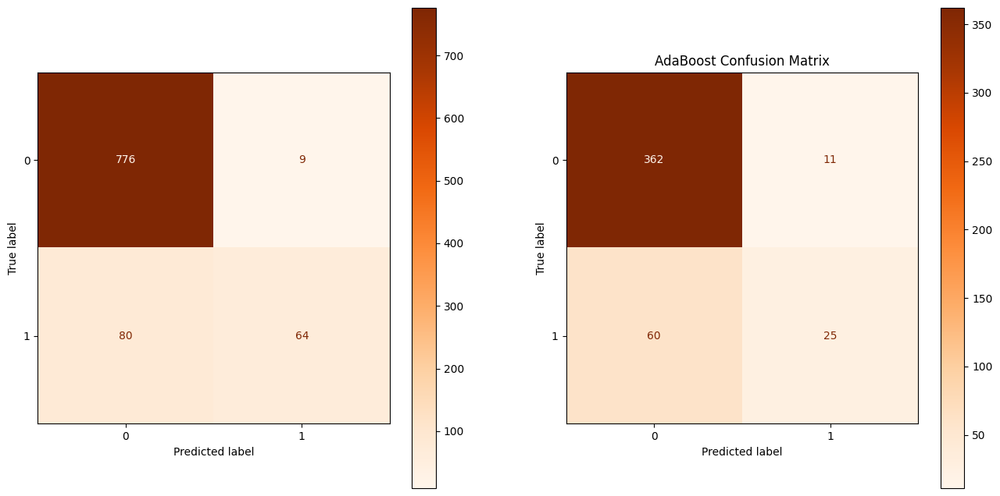

In [ ]:
def our_confusion_matrix(model, name='Model'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    ConfusionMatrixDisplay.from_estimator(model, X_train, y_train, cmap="Oranges", ax=ax1)
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap="Oranges", ax=ax2)
    plt.title(f"{name} Confusion Matrix")

our_confusion_matrix(ada, "AdaBoost")

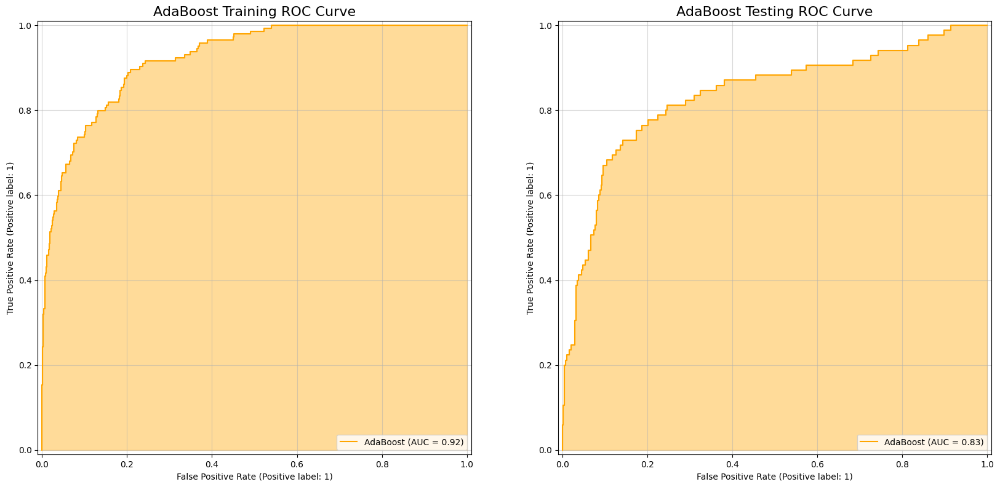

In [ ]:
def our_roc(model, name="Model"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    roc1 = RocCurveDisplay.from_estimator(
    ada, X_train, y_train,
    name=name, ax=ax1,
    color="orange" #juicy juicy
    )
    roc2 = RocCurveDisplay.from_estimator(
        ada, X_test, y_test,
        name=name, ax=ax2,
        color="orange" #juicy juicy
    )
    ax1.fill_between(roc1.fpr, roc1.tpr, alpha=0.4, color="orange")
    ax2.fill_between(roc2.fpr, roc2.tpr, alpha=0.4, color="orange")
    ax1.set_title(f"{name} Training ROC Curve", fontsize=16)
    ax2.set_title(f"{name} Testing ROC Curve", fontsize=16)
    for ax in [ax1, ax2]:
        ax.grid(alpha=0.5)

our_roc(ada, "AdaBoost")

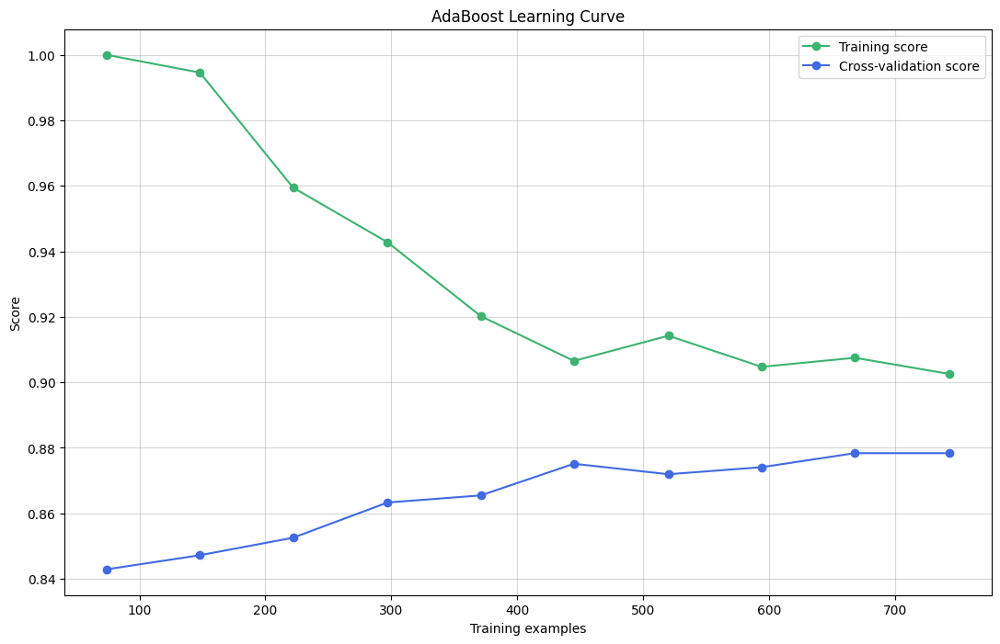

In [ ]:
def our_learning_curve(model, name='Model'):
    train_sizes, train_scores, test_scores = learning_curve(
        model, X_train, y_train, cv=5, scoring='accuracy',
        train_sizes=np.linspace(0.1, 1.0, 10), random_state=0
    )

    plt.figure(figsize=(13, 8))
    plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', color="mediumseagreen", label="Training score")
    plt.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', color="royalblue", label="Cross-validation score")
    plt.title(f"{name} Learning Curve")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.legend(loc="best")
    plt.grid(alpha=0.5)

our_learning_curve(ada, "AdaBoost")

[Text(3, 0, '0.000'),
 Text(3, 0, '0.000'),
 Text(3, 0, '0.000'),
 Text(3, 0, '0.000'),
 Text(3, 0, '0.000'),
 Text(3, 0, '0.000'),
 Text(3, 0, '0.000'),
 Text(3, 0, '0.006'),
 Text(3, 0, '0.013'),
 Text(3, 0, '0.014'),
 Text(3, 0, '0.015'),
 Text(3, 0, '0.016'),
 Text(3, 0, '0.017'),
 Text(3, 0, '0.019'),
 Text(3, 0, '0.020'),
 Text(3, 0, '0.022'),
 Text(3, 0, '0.023'),
 Text(3, 0, '0.025'),
 Text(3, 0, '0.026'),
 Text(3, 0, '0.026'),
 Text(3, 0, '0.028'),
 Text(3, 0, '0.030'),
 Text(3, 0, '0.033'),
 Text(3, 0, '0.036'),
 Text(3, 0, '0.036'),
 Text(3, 0, '0.044'),
 Text(3, 0, '0.046'),
 Text(3, 0, '0.047'),
 Text(3, 0, '0.051'),
 Text(3, 0, '0.051'),
 Text(3, 0, '0.055'),
 Text(3, 0, '0.086'),
 Text(3, 0, '0.214')]

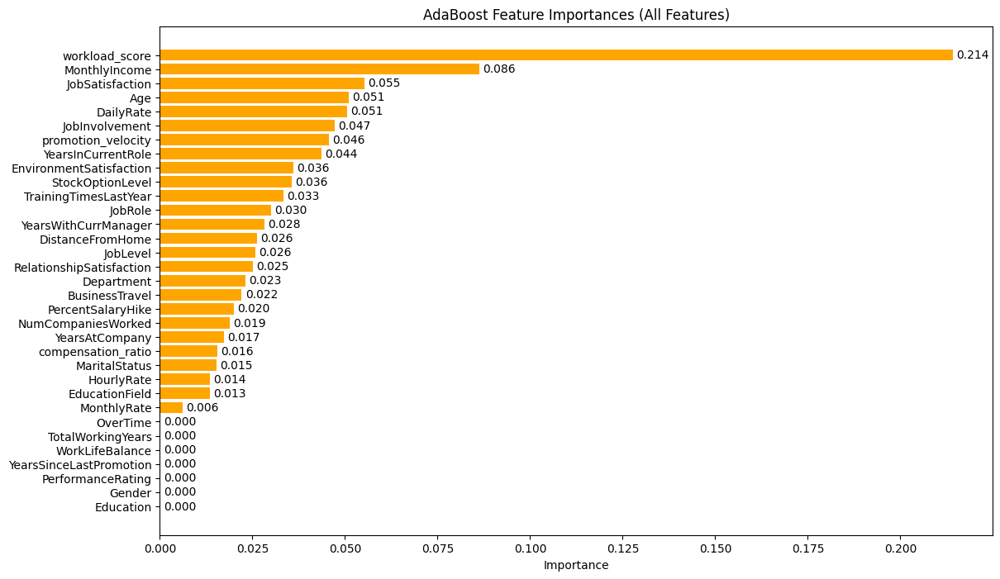

In [ ]:
importances = ada.feature_importances_
feat_idx = np.argsort(importances)[::-1]

plt.figure(figsize=(13, 8))
ax = plt.gca()
bars = ax.barh(X_train.columns[feat_idx][::-1], importances[feat_idx][::-1], color="orange")
ax.set_xlabel("Importance")
ax.set_title("AdaBoost Feature Importances (All Features)")
ax.bar_label(bars, fmt="%.3f", padding=3, fontsize=10)

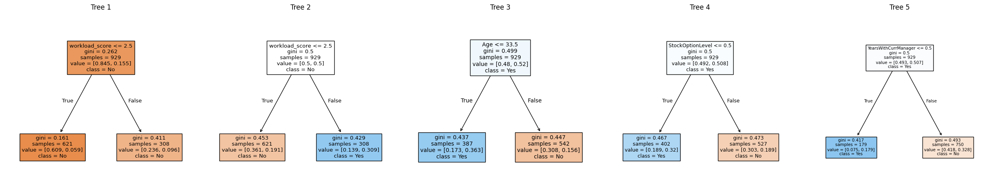

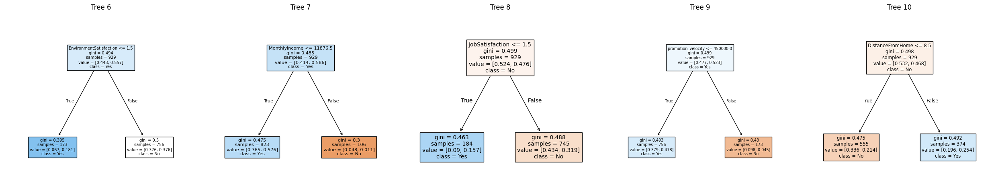

In [ ]:
for i in range(0, 10, 5):
    fig, axes = plt.subplots(1, 5, figsize=(25, 5))
    for j, ax in enumerate(axes):
        idx = i + j
        plot_tree(ada.estimators_[idx], feature_names=X_train.columns, class_names=['No', 'Yes'], filled=True, ax=ax)
        ax.set_title(f"Tree {idx+1}")

    plt.tight_layout()

<Figure size 2100x1300 with 0 Axes>

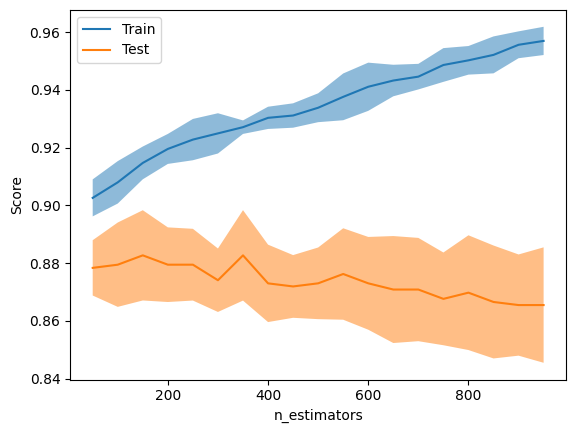

In [ ]:
from sklearn.model_selection import ValidationCurveDisplay, validation_curve

param_name, param_range = "n_estimators", np.arange(50, 1000, 50)
train_scores, test_scores = validation_curve(
    ada, X_train, y_train, param_name=param_name, param_range=param_range
)
plt.figure(figsize=(21, 13))
display = ValidationCurveDisplay(
    param_name=param_name, param_range=param_range,
    train_scores=train_scores, test_scores=test_scores, score_name="Score"
)
display.plot()

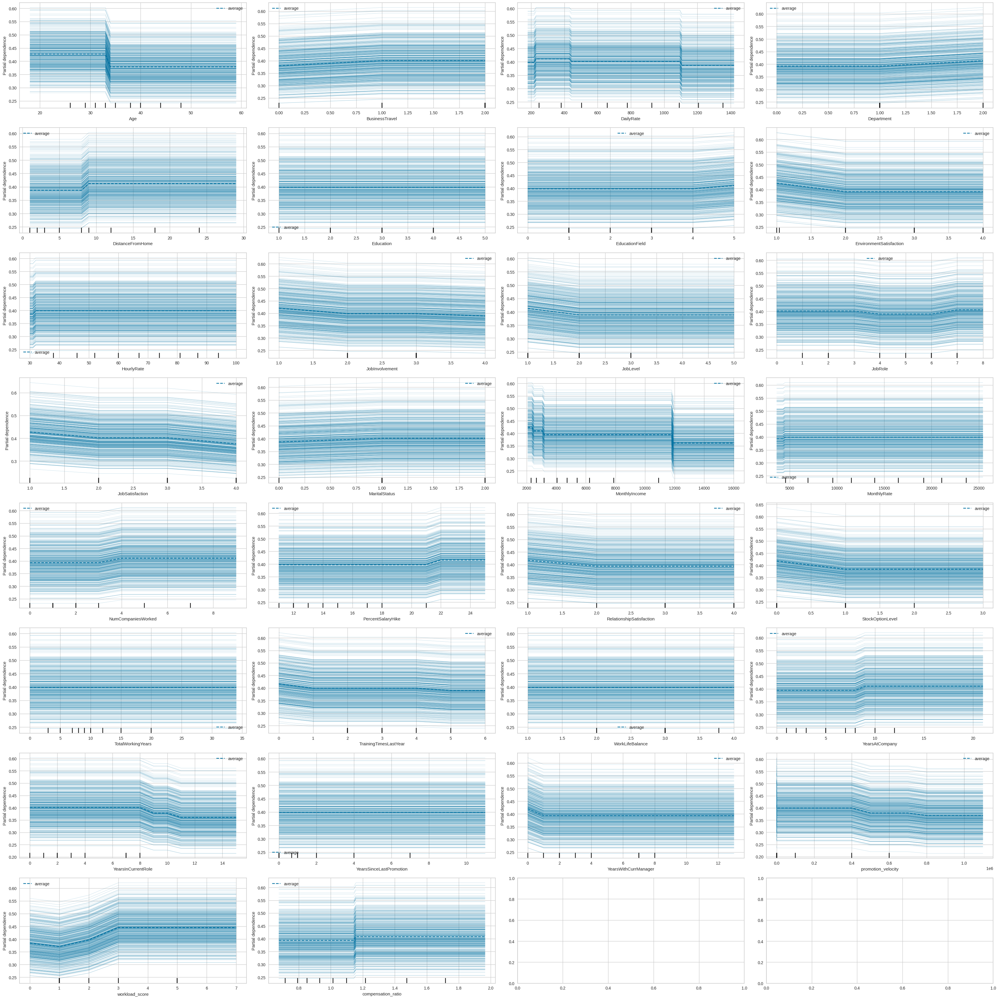

In [ ]:
cols = [c for c in X_test.columns if X_test[c].nunique()>2]
nc = 4
nr = (len(cols) + nc - 1) // nc
fig, axes = plt.subplots(nr, nc, figsize=(34, 34))
for ax, feat in zip(axes.flatten(), cols):
    PartialDependenceDisplay.from_estimator(
        ada, X_test, [feat], ax=ax, kind='both'
    )
plt.tight_layout()

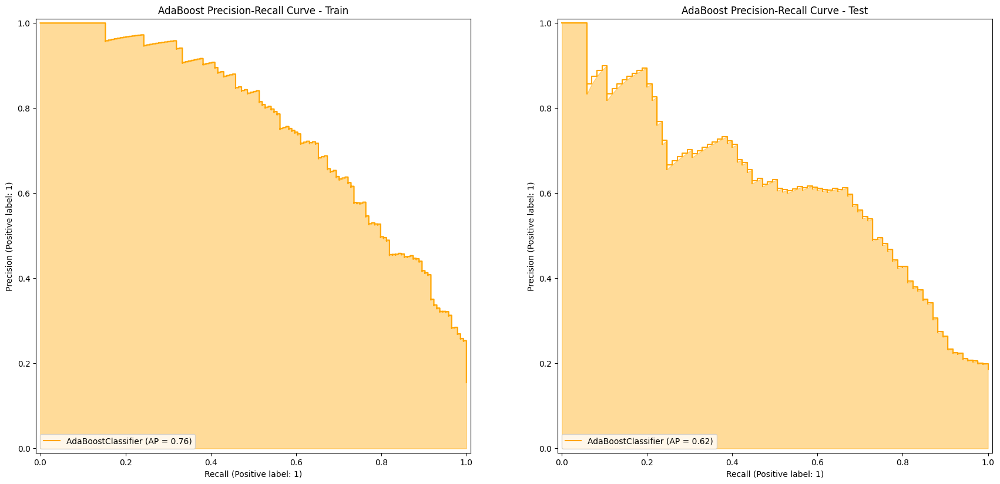

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay
def our_prc(model, name="Model"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(21, 13))
    train_disp = PrecisionRecallDisplay.from_estimator(model, X_train, y_train, ax=ax1, color='orange')
    test_disp = PrecisionRecallDisplay.from_estimator(model, X_test, y_test, ax=ax2, color='orange')
    ax1.set_title(f"{name} Precision-Recall Curve - Train")
    ax2.set_title(f"{name} Precision-Recall Curve - Test")
    ax1.fill_between(train_disp.recall, train_disp.precision, alpha=0.4, color='orange')
    ax2.fill_between(test_disp.recall, test_disp.precision, alpha=0.4, color='orange')

our_prc(ada, "AdaBoost")

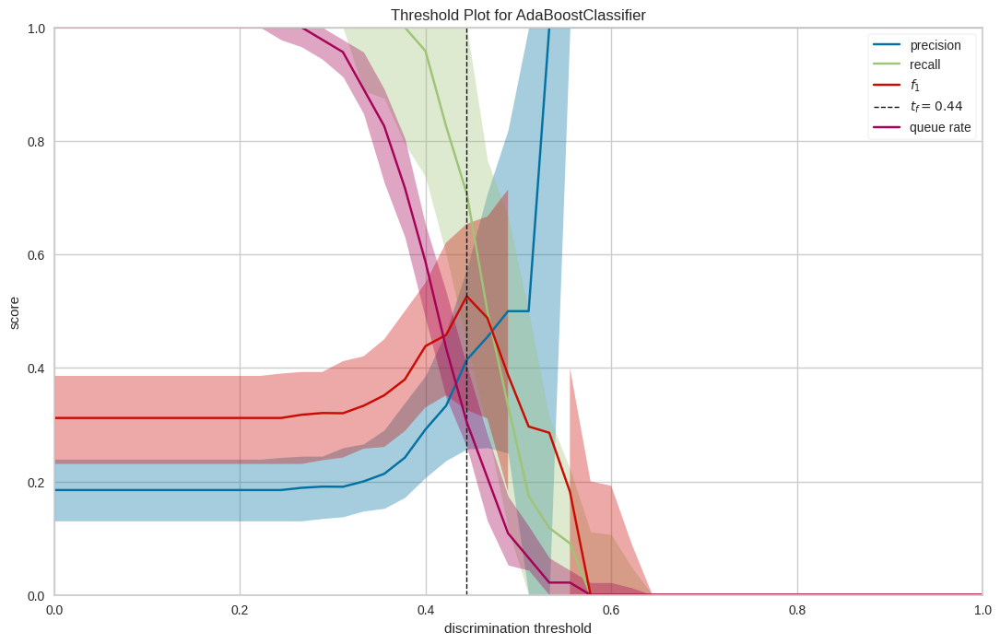

<Axes: title={'center': 'Threshold Plot for AdaBoostClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [ ]:
from yellowbrick.classifier import DiscriminationThreshold
plt.figure(figsize=(13, 8))
DiscriminationThreshold(ada).fit(X_test, y_test).poof()

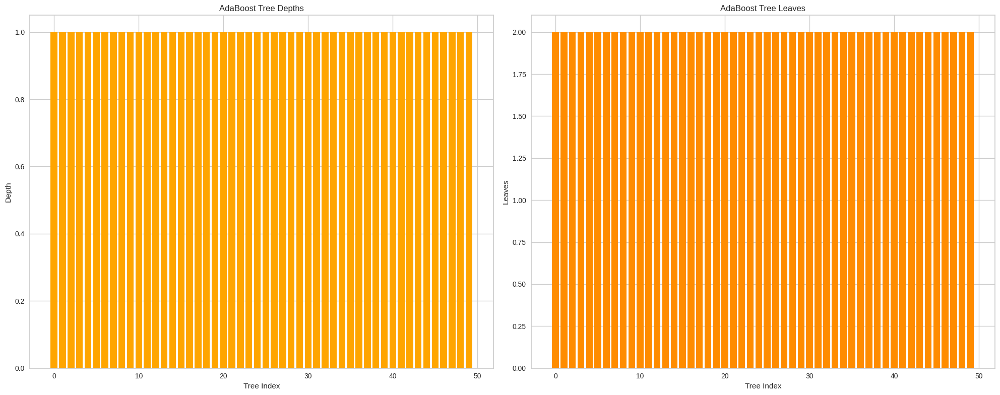

In [ ]:
tree_depths = [est.tree_.max_depth for est in ada.estimators_]
tree_leaves = [est.tree_.n_leaves for est in ada.estimators_]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
ax1.bar(range(len(tree_depths)), tree_depths, color="orange")
ax1.set_title("AdaBoost Tree Depths")
ax1.set_xlabel("Tree Index")
ax1.set_ylabel("Depth")
ax2.bar(range(len(tree_leaves)), tree_leaves, color="darkorange")
ax2.set_title("AdaBoost Tree Leaves")
ax2.set_xlabel("Tree Index")
ax2.set_ylabel("Leaves")
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Feature Usage Frequency (AdaBoost Trees)')

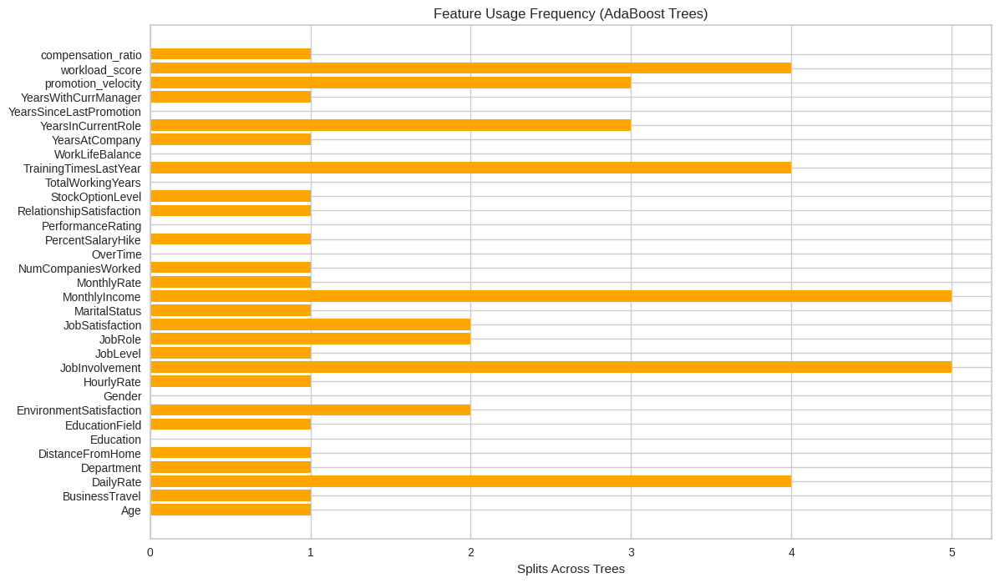

In [ ]:
from collections import Counter
feature_counts = Counter()
for est in ada.estimators_:
    used = est.tree_.feature
    used = used[used >= 0]
    feature_counts.update(used)
feat_names = np.array(X_train.columns)
freq = np.array([feature_counts.get(i, 0) for i in range(len(feat_names))])
plt.figure(figsize=(13, 8))
plt.barh(feat_names, freq, color="orange")
plt.xlabel("Splits Across Trees")
plt.title("Feature Usage Frequency (AdaBoost Trees)")

In [ ]:
from lime.lime_tabular import LimeTabularExplainer
class_names = ['Attrition', 'No Attrition']
feature_names = list(X_train.columns)
explainer = LimeTabularExplainer(X_train.values, feature_names =
                                 feature_names,
                                 class_names = class_names,
                                 mode = 'classification')


In [ ]:
exp = explainer.explain_instance(
    X_test.values[1],
    ada.predict_proba,
    num_features=len(feature_names)
)
exp.show_in_notebook(show_table=True)

In [ ]:
import shap
explainer = shap.KernelExplainer(ada.predict_proba, X_test[:500])
shap_values = explainer.shap_values(X_test[:500])

  0%|          | 0/458 [00:00<?, ?it/s]

In [ ]:
shap_values

array([[[-0.02817697,  0.02817697],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ],
        [ 0.03051815, -0.03051815],
        [ 0.        ,  0.        ]],

       [[ 0.02052095, -0.02052095],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ]],

       [[-0.02684905,  0.02684905],
        [ 0.        ,  0.        ],
        [-0.00887252,  0.00887252],
        ...,
        [ 0.03456105, -0.03456105],
        [ 0.        ,  0.        ],
        [-0.00617435,  0.00617435]],

       ...,

       [[-0.0259172 ,  0.0259172 ],
        [ 0.        ,  0.        ],
        [ 0.01442313, -0.01442313],
        ...,
        [ 0.        ,  0.        ],
        [-0.04351298,  0.04351298],
        [-0.00777979,  0.00777979]],

       [[-0.0284332 ,  0.0284332 ],
        [ 0.        ,  0.  

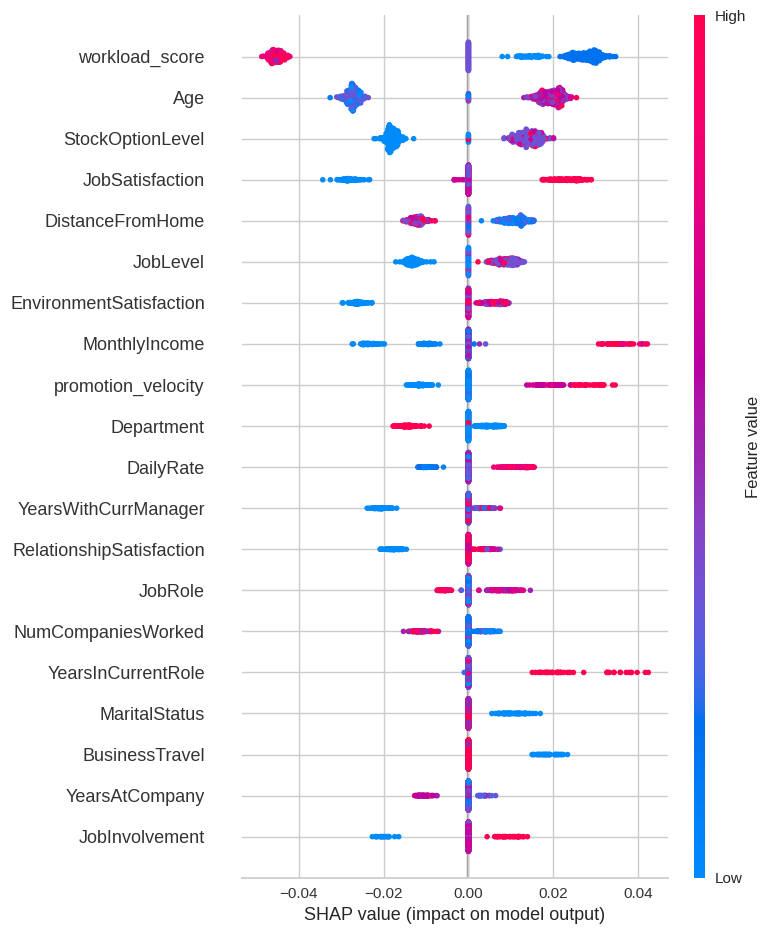

In [ ]:
shap.summary_plot(shap_values[:, :, 0], X_test[:500])

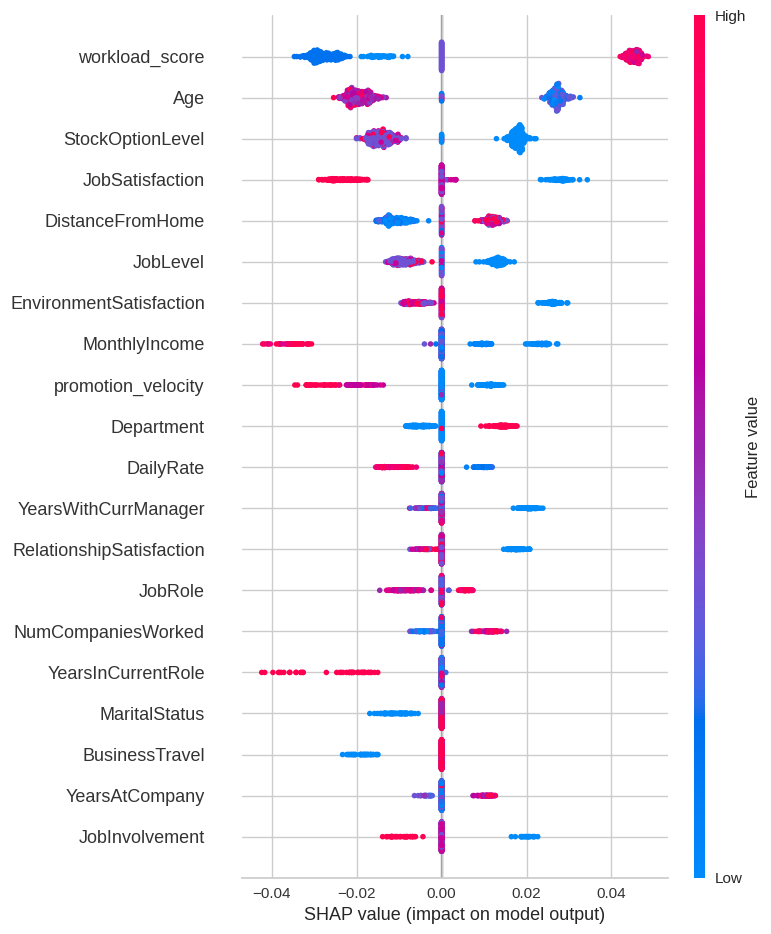

In [ ]:
shap.summary_plot(shap_values[:, :, 1], X_test[:500])

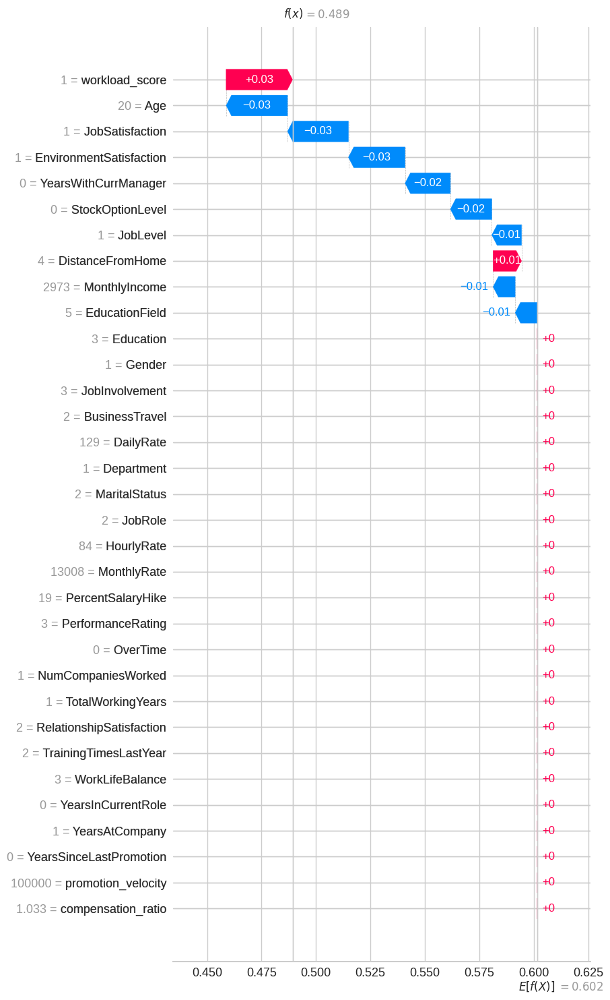

In [ ]:
shap_values_exp = shap.Explanation(
    values=shap_values[0][:, 0],
    base_values=explainer.expected_value[0],
    data=X_test.iloc[0],
    feature_names=X_test.columns
)

shap.waterfall_plot(shap_values_exp, max_display=len(X_test.columns))